$\Huge Computational$ $\Huge Intelligence$ $\Huge Lab$

$\Huge  Assignment$ $\Huge 4$
---
Katarzyna Wilk gr 2
---

# 4.1 Introduction - dedicated layers for image augmentation

*  Perform various image transformations (rotation, flipping, croping, scaling)
*  Parameters specify ranges of transformations
*  Can be used as functions (eagerly) - executed on the host
*  Can be used as network layers  - executed as a computational graph (possibly on GPU)

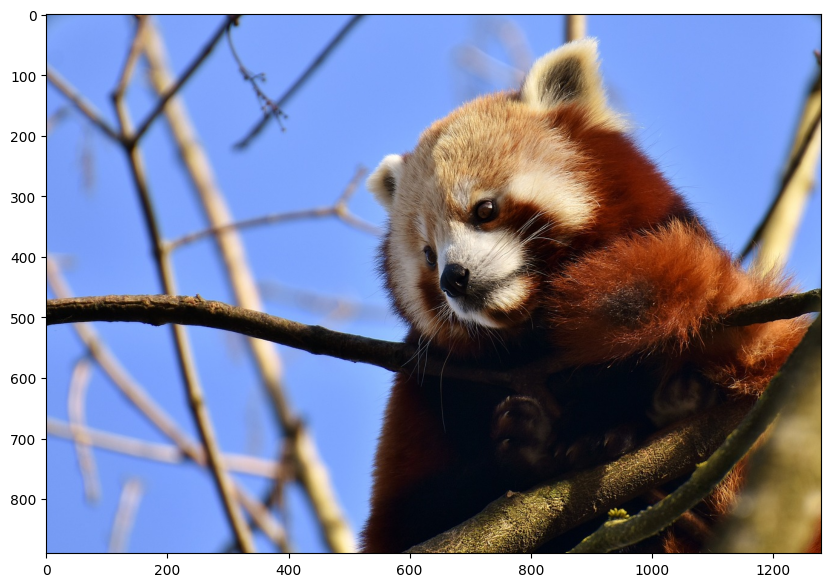

In [ ]:
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (5, 5)


url='https://cdn.pixabay.com/photo/2018/02/18/00/22/panda-3161290_1280.jpg'
response = requests.get(url)
# print(response)
img = Image.open(BytesIO(response.content))

plt.rcParams['figure.figsize'] = (10, 10)
_ = plt.imshow(img)



In [ ]:
import numpy as np
import tensorflow as tf
from keras import layers
from keras import models

X = np.array(img)

**Function displaying a few images after conversion**

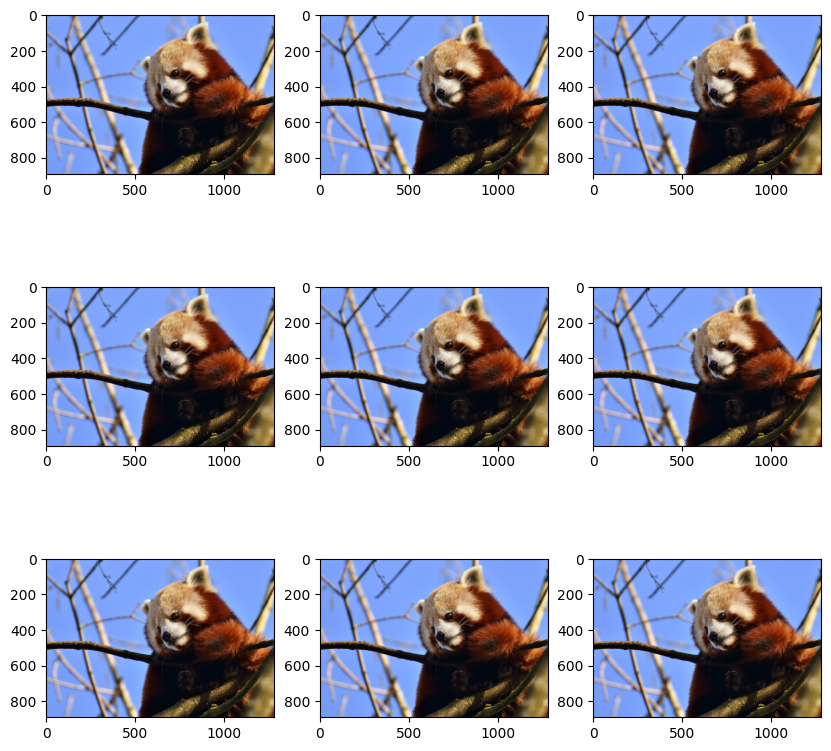

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10,10)

def display(X,converter,title=None):

  for i in range(9):
    ax = plt.subplot(330 + 1 + i)
    converted_image  = converter(X)
    plt.imshow(converted_image)
  if title is not None:
    plt.suptitle(title)
  plt.show()

display(X,lambda a:a)

## RandomContrast

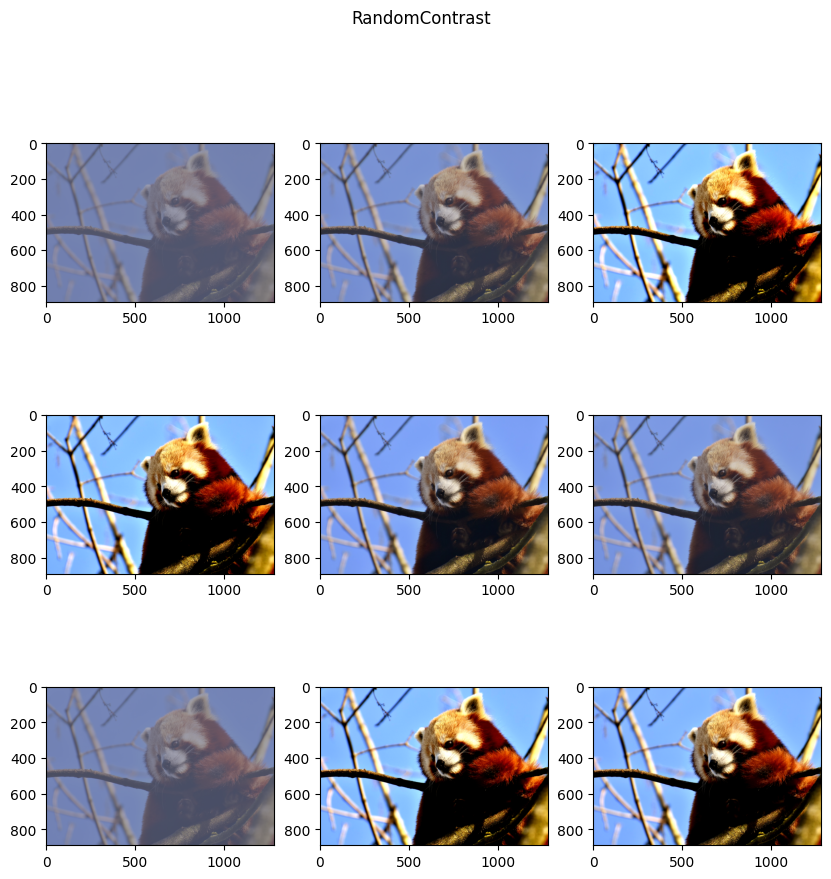

In [ ]:
converter = models.Sequential([
  layers.RandomContrast(.8,seed=1),
  layers.Rescaling(1./255)
])

display(X,converter,title='RandomContrast')

## Test more converters

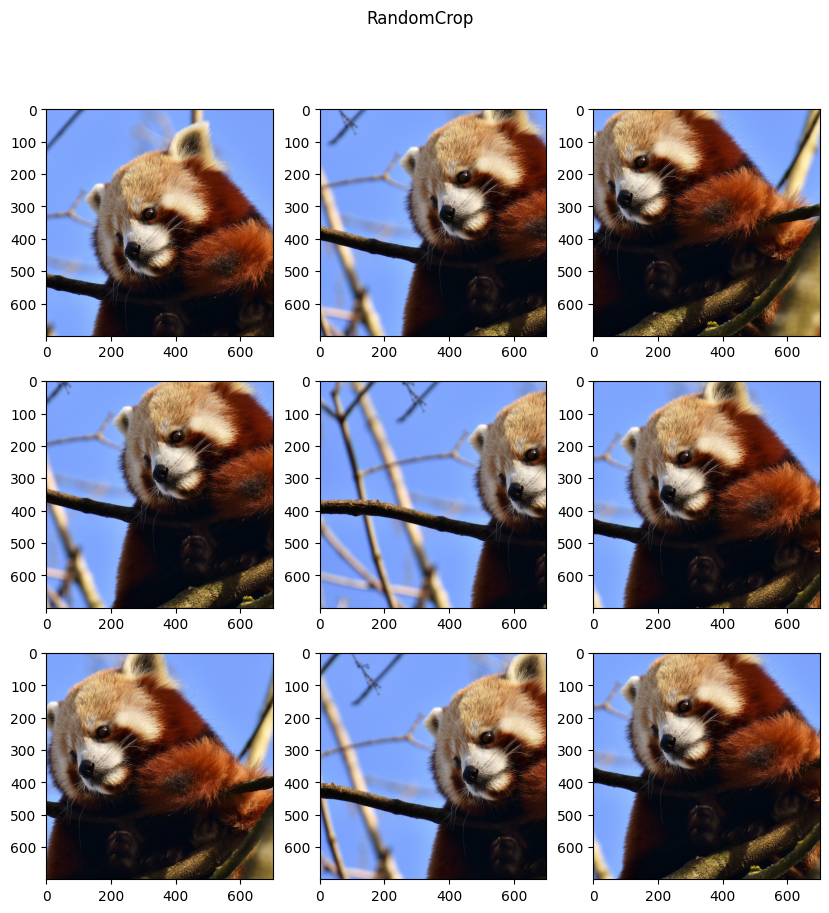

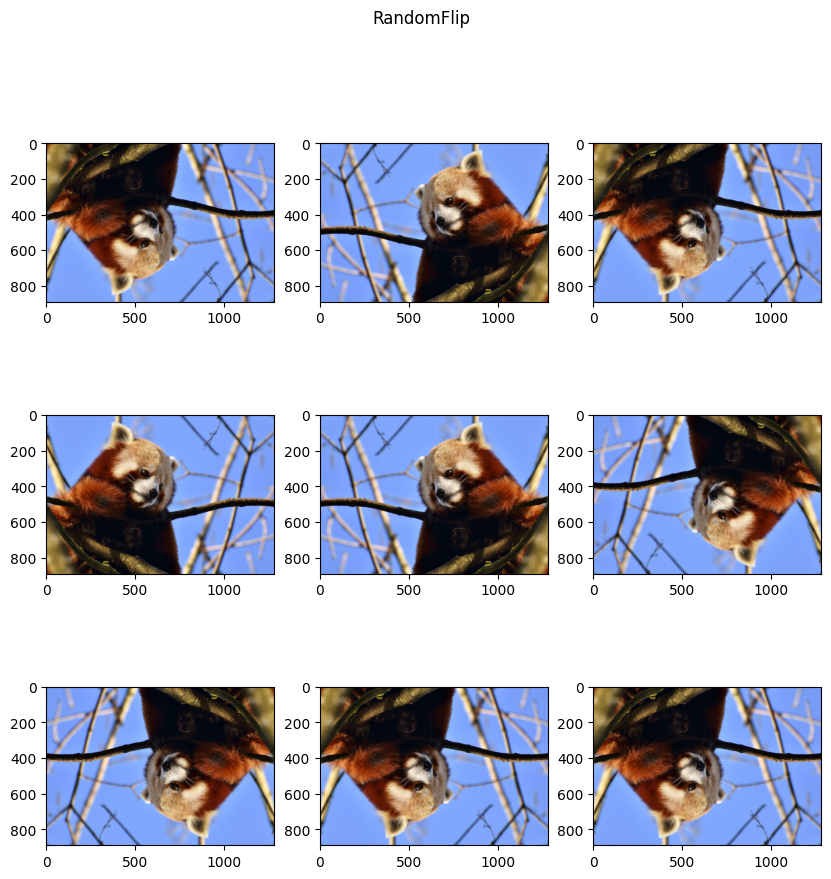

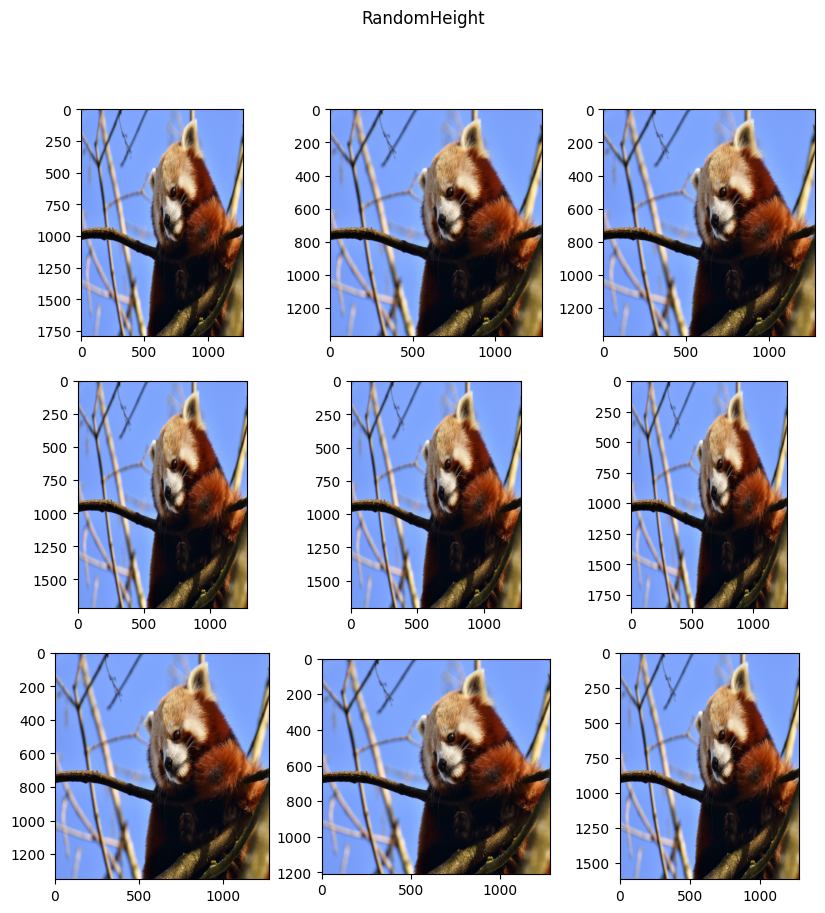

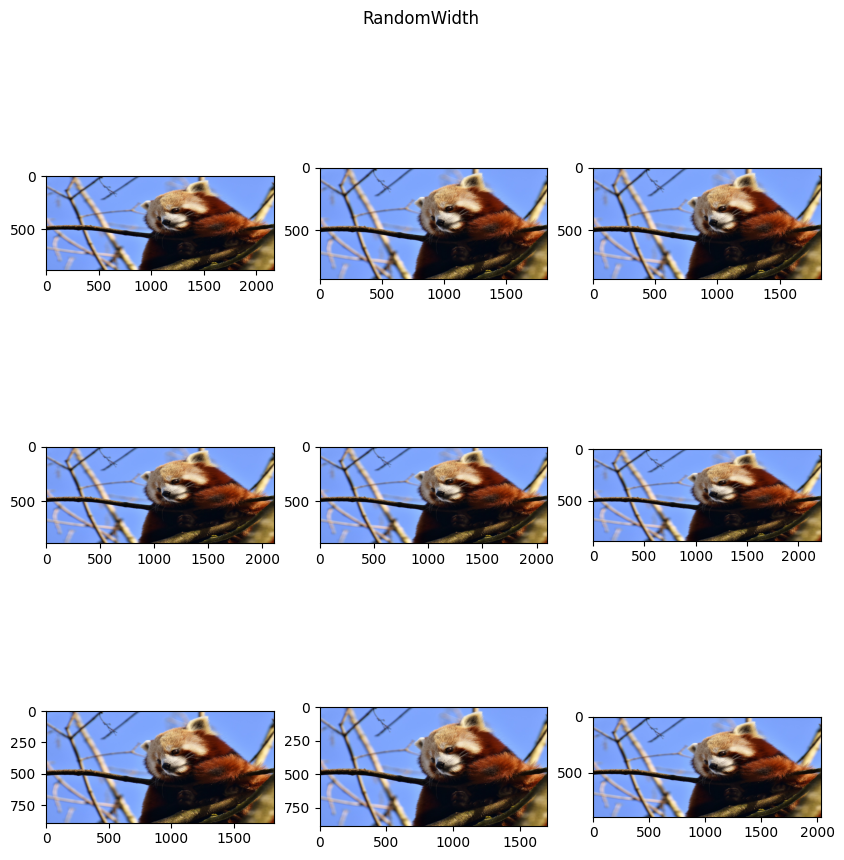

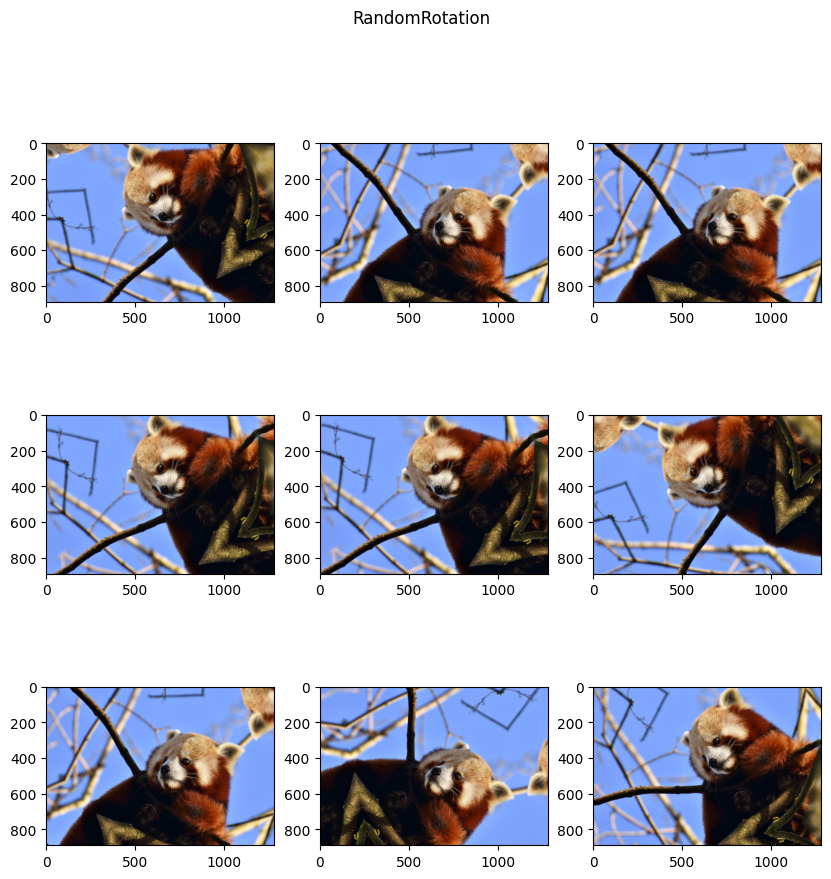

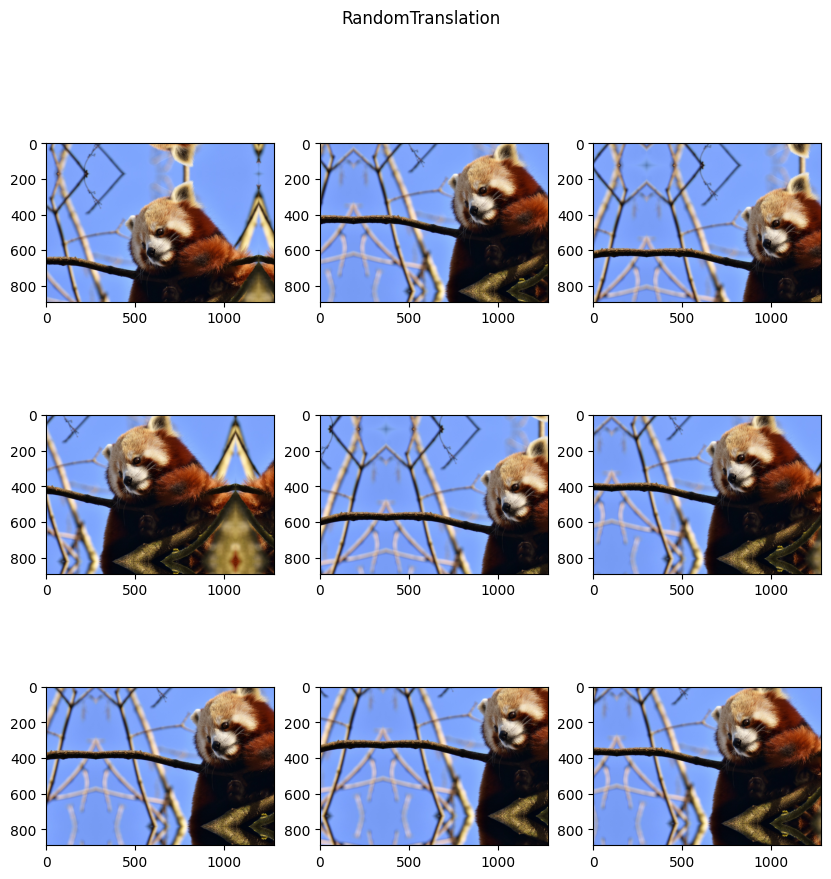

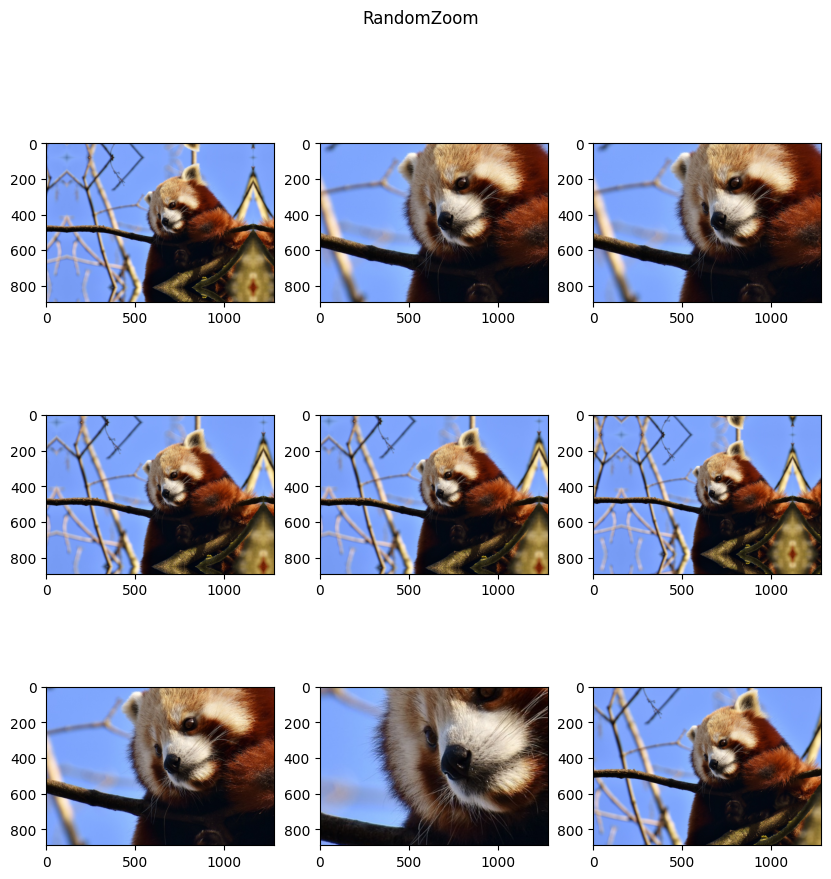

In [ ]:
preprocessing_layers = [
    layers.RandomCrop(height=700,width=700,seed=1),
    layers.RandomFlip(mode="horizontal_and_vertical", seed=1),
    layers.RandomHeight(factor=(0.3,1.2),seed=1),
    layers.RandomWidth(factor=(0.3,0.8),seed=1),
    layers.RandomRotation((-0.25,0.25),seed=1),
    layers.RandomTranslation(height_factor=(-0.2, 0.3), width_factor=(-0.2, 0.3), seed=1),
    layers.RandomZoom(height_factor=(-0.8,.5),seed=1)

]

for pl in preprocessing_layers:
  print()
  # print(f'=========== {pl.__class__.__name__} ============')
  converter = models.Sequential([
    pl,
    layers.Rescaling(1./255)
  ])
  display(X,converter,title=pl.__class__.__name__)

# 4.2 Horses or humans

We will use  [horses_or_humans](https://www.tensorflow.org/datasets/catalog/horses_or_humans) tensorflow dataset.

The TF daset API returns data wrapped as [tf.data.Dataset](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#take) object.

tf.data.Dataset can be considered an equivalent to Java stream. It provides such operations as mapping, filtering, limiting, shuffling and skipping data. It is also reponsible for formation of batches.

Dataset is intended to execute on CPU in parallel with training on GPU. While the network is trained using data in a current batch, a next batch is fetched and prepared for delivery.

In [ ]:
import tensorflow_datasets as tfds
import tensorflow as tf

ds_train = tfds.load('horses_or_humans', split='train', as_supervised=True, shuffle_files=False)
ds_test = tfds.load('horses_or_humans', split='test', as_supervised=True, shuffle_files=False)

ds_val = tfds.load("horses_or_humans", split='test', as_supervised=True)


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/1027 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/horses_or_humans/3.0.0.incomplete91HAME/horses_or_humans-train.tfrecord*..…

Generating test examples...:   0%|          | 0/256 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/horses_or_humans/3.0.0.incomplete91HAME/horses_or_humans-test.tfrecord*...…

Dataset horses_or_humans downloaded and prepared to /root/tensorflow_datasets/horses_or_humans/3.0.0. Subsequent calls will reuse this data.


In [ ]:
# How many elements?
print(f'Number of images in train set: {ds_train.cardinality()}')
print(f'Number of images in test set: {ds_test.cardinality()}')

print(f'Number of images in validation set: {ds_val.cardinality()}')

Number of images in train set: 1027
Number of images in test set: 256
Number of images in validation set: 256


In [ ]:
# How many classes

labels = [label.numpy() for image, label in ds_train]
num_classes = max(labels)+1
print(f'#classes = {num_classes}')

#classes = 2


In [ ]:
# image shapes?

images = [image.numpy() for image, label in ds_train.take(10)] # first 10 images
for img in images:
  print(f'shape={img.shape}')

shape=(300, 300, 3)
shape=(300, 300, 3)
shape=(300, 300, 3)
shape=(300, 300, 3)
shape=(300, 300, 3)
shape=(300, 300, 3)
shape=(300, 300, 3)
shape=(300, 300, 3)
shape=(300, 300, 3)
shape=(300, 300, 3)


### Display a few images

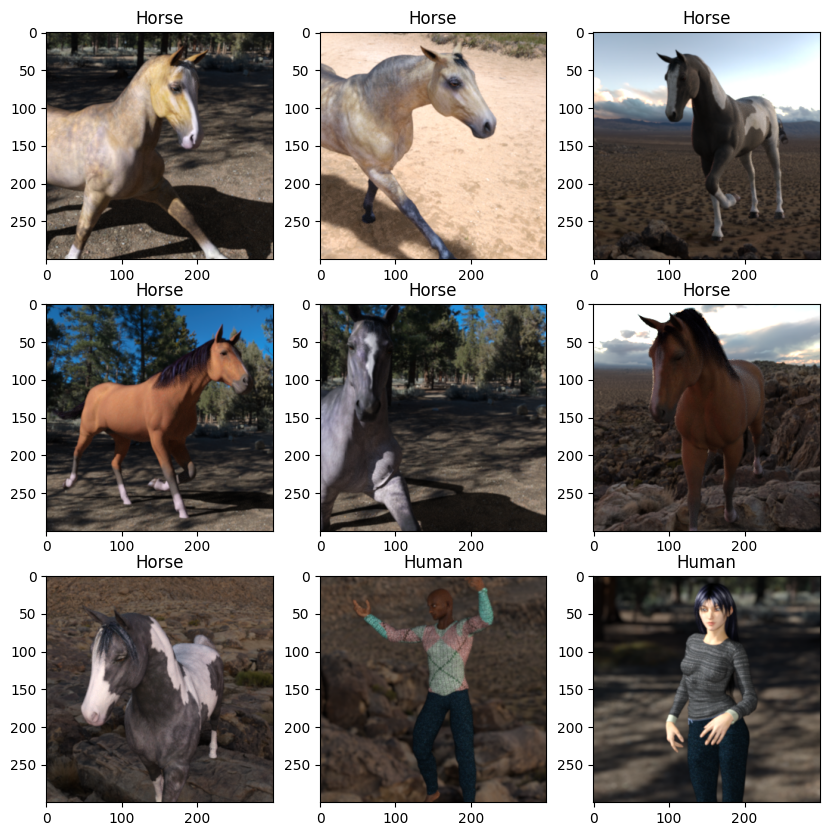

In [ ]:
#display a few images...
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10, 10)

ds2 = ds_train.take(9) # take - equivalent of limit
it = ds2.as_numpy_iterator()

labels=['Horse','Human']
input_size=100
for i in range(9):
  ax = plt.subplot(330 + 1 + i)
  image, label = next(it)
  ax.set_title(labels[label])
  plt.imshow(image)
plt.show()

### Apply sample transformations

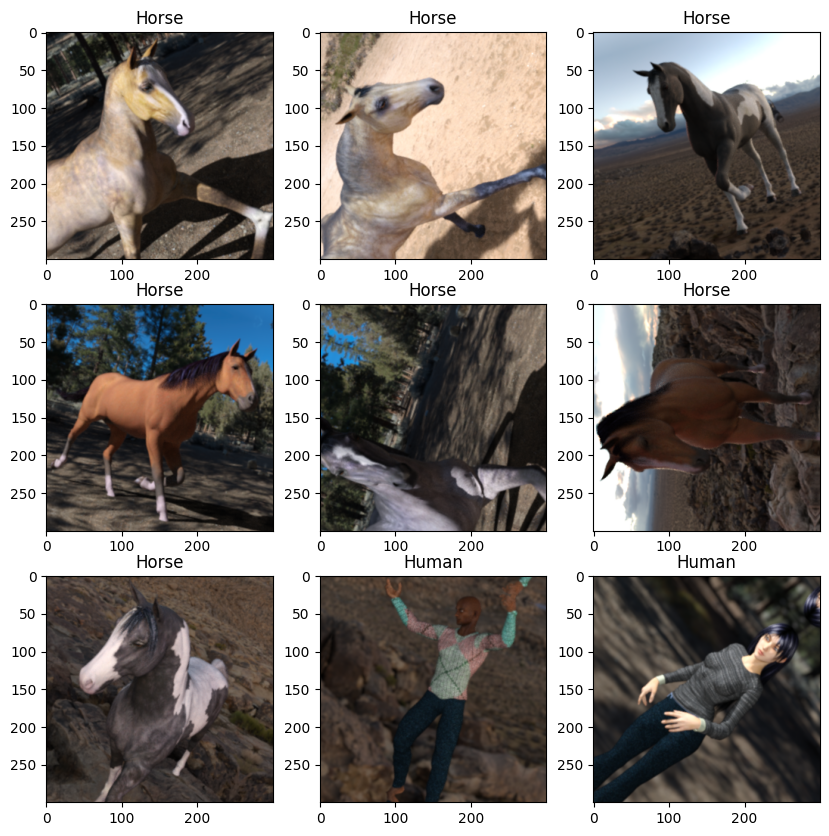

In [ ]:
rotate = layers.RandomRotation((-0.25,0.25),seed=123)
rescale = layers.Rescaling(1./255)
ds2 = ds_train.take(9).map(lambda x,y: (rescale(rotate(x)),y)) #<<<<< rotate then rescale
it = ds2.as_numpy_iterator()


labels=['Horse','Human']
input_size=100
for i in range(9):
  ax = plt.subplot(330 + 1 + i)
  image, label = next(it)
  ax.set_title(labels[label])
  plt.imshow(image)
plt.show()

## 4.2.1 Classification (no augmentation)
**TODO 4.2.1** Propose your own model consisting of a few Conv2D, MaxPooling2D and (optionaly) dropout layers. Then Flatten, Dense. As this is a binary classification problem - you may use one (sigmoid) or two (softmax) neurons in the output layer. Please observe: the shape of input layer must match the shapes of images.

In [ ]:
from keras import layers
from keras import models
from keras import optimizers

image_width = 300
image_height = 300

def get_classifier_model():
  classifier_model = models.Sequential([
    layers.Conv2D(16, (3,3), activation='relu', input_shape=(image_height,image_width, 3)),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.1),
    layers.Conv2D(16, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.1),
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.2),
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.2),
    layers.Flatten(),
    layers.Dense(32, activation='relu'),
    layers.Dropout(0.1),
    layers.Dense(num_classes, activation='softmax')
    ])
  return classifier_model




### Configuration of Dataset streams


In [ ]:
def prepare_dataset(ds,batch_size=64,resize=None, augment=None):
  if resize is not None:
    ds = ds.map(lambda x, y: (resize(x), y),
              num_parallel_calls=tf.data.AUTOTUNE)

  ds = ds.shuffle(1000)
  ds = ds.batch(batch_size)

  if augment is not None:
    ds = ds.map(lambda x, y: (augment(x), y),
              num_parallel_calls=tf.data.AUTOTUNE)

  return ds.prefetch(buffer_size=tf.data.AUTOTUNE)

ds_train_preprocessed = prepare_dataset(ds_train)
ds_test_preprocessed = prepare_dataset(ds_test)


### Training

In [ ]:
classifier_model = get_classifier_model()

classifier_model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-3),
              metrics=['accuracy'])
classifier_model.summary()

epochs = 20
hist = classifier_model.fit(ds_train_preprocessed,epochs=epochs, validation_data = ds_val.batch(16))

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 149, 149, 16)      0         
 ng2D)                                                           
                                                                 
 dropout_24 (Dropout)        (None, 149, 149, 16)      0         
                                                                 
 conv2d_21 (Conv2D)          (None, 147, 147, 16)      2320      
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 73, 73, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_25 (Dropout)        (None, 73, 73, 16)      

### Evaluate results

In [ ]:
loss, acc = classifier_model.evaluate(ds_test_preprocessed)
print("Accuracy", acc)

4/4 [==============================] - 0s 21ms/step - loss: 7.5937 - accuracy: 0.6992
Accuracy 0.69921875


Save

In [ ]:
classifier_model.save("my_model.h5")

## 4.2.2. Augmentation on host
In this setup images will be transformed during operations performed by tf.data.Dataset. Batch data can be prepared in parallel by multiple CPU threads.

**TODO 4.2.2** Design your own transformations sequence consisting of at least two steps (apart from resizing and rescaling). Avoid shots that are not likely to occur. Rather introduce small modifications...

In [ ]:
# image_width = 300
# image_height = 300

transform = models.Sequential([
  layers.RandomBrightness(0.2),
  layers.RandomFlip(seed=1,mode="horizontal"),
  layers.RandomCrop(height=image_height//3, width=image_width//3, seed=1),
  layers.RandomRotation(0.15,seed=1),
  layers.Resizing(image_height, image_width),
  layers.Rescaling(1./255)
])

resize = models.Sequential([
  layers.Resizing(image_width, image_height),
  layers.Rescaling(1./255)
])


**Augmentation is applied to ds_train. Test data are not transformed.**

In [ ]:
ds_train_preprocessed = prepare_dataset(ds_train,augment = transform )
ds_test_preprocessed = prepare_dataset(ds_test)

**TODO 4.2.3** Compile, fit during 20 epochs and evaluate results

In [ ]:
classifier_model = get_classifier_model()

classifier_model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-4),
              metrics=['accuracy'])

classifier_model.summary()

hist = classifier_model.fit(ds_train_preprocessed, epochs=20, validation_data = ds_val.batch(16))

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 149, 149, 16)      0         
 ng2D)                                                           
                                                                 
 dropout_30 (Dropout)        (None, 149, 149, 16)      0         
                                                                 
 conv2d_26 (Conv2D)          (None, 147, 147, 16)      2320      
                                                                 
 max_pooling2d_26 (MaxPooli  (None, 73, 73, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_31 (Dropout)        (None, 73, 73, 16)      

In [ ]:
loss, acc = classifier_model.evaluate(ds_test_preprocessed)
print("Accuracy", acc)

4/4 [==============================] - 0s 30ms/step - loss: 36.7377 - accuracy: 0.5000
Accuracy 0.5


## 4.2.3 Augmentation on GPU

In this case transformation layers are part of the model. We compose the model from two submodels: transform and classifier_model.

Data augmentation step is not included into Dataset stream.

In [ ]:
classifier_model = get_classifier_model()

full_model = models.Sequential([
  transform,
  classifier_model
])

ds_train_preprocessed = prepare_dataset(ds_train)
ds_test_preprocessed = prepare_dataset(ds_test)

**TODO 4.2.4** Compile full_model, train during 20 epochs? Compute accuracy on the tets set.

In [ ]:
full_model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-4),
              metrics=['accuracy'])

epochs = 20
hist = full_model.fit(ds_train_preprocessed, epochs=epochs, validation_data = ds_val.batch(16))

Epoch 1/20
17/17 [==============================] - 6s 166ms/step - loss: 0.7019 - accuracy: 0.4966 - val_loss: 0.6906 - val_accuracy: 0.5000
Epoch 2/20
17/17 [==============================] - 2s 124ms/step - loss: 0.6895 - accuracy: 0.5287 - val_loss: 0.6919 - val_accuracy: 0.5859
Epoch 3/20
17/17 [==============================] - 2s 121ms/step - loss: 0.6887 - accuracy: 0.5161 - val_loss: 0.6921 - val_accuracy: 0.5430
Epoch 4/20
17/17 [==============================] - 2s 122ms/step - loss: 0.6841 - accuracy: 0.5550 - val_loss: 0.6927 - val_accuracy: 0.5000
Epoch 5/20
17/17 [==============================] - 2s 122ms/step - loss: 0.6850 - accuracy: 0.5433 - val_loss: 0.6921 - val_accuracy: 0.5000
Epoch 6/20
17/17 [==============================] - 2s 125ms/step - loss: 0.6914 - accuracy: 0.5307 - val_loss: 0.6919 - val_accuracy: 0.5000
Epoch 7/20
17/17 [==============================] - 2s 126ms/step - loss: 0.6832 - accuracy: 0.5365 - val_loss: 0.6919 - val_accuracy: 0.5000
Epoch 

In [ ]:
loss, acc = full_model.evaluate(ds_test_preprocessed)
print("Accuracy", acc)

4/4 [==============================] - 0s 33ms/step - loss: 0.6865 - accuracy: 0.6641
Accuracy 0.6640625


**TODO 4.2.5** Data augmentation introduces noise, continue training and check accuracy

In [ ]:
epochs=80
hist = full_model.fit(ds_train_preprocessed, epochs=epochs, validation_data = ds_val.batch(16))


Epoch 1/80
17/17 [==============================] - 2s 135ms/step - loss: 0.6686 - accuracy: 0.5764 - val_loss: 0.6936 - val_accuracy: 0.5000
Epoch 2/80
17/17 [==============================] - 2s 122ms/step - loss: 0.6538 - accuracy: 0.6144 - val_loss: 0.6911 - val_accuracy: 0.5000
Epoch 3/80
17/17 [==============================] - 2s 120ms/step - loss: 0.6586 - accuracy: 0.6203 - val_loss: 0.6865 - val_accuracy: 0.5000
Epoch 4/80
17/17 [==============================] - 2s 120ms/step - loss: 0.6699 - accuracy: 0.5901 - val_loss: 0.6935 - val_accuracy: 0.5000
Epoch 5/80
17/17 [==============================] - 2s 120ms/step - loss: 0.6733 - accuracy: 0.5940 - val_loss: 0.6896 - val_accuracy: 0.5000
Epoch 6/80
17/17 [==============================] - 2s 121ms/step - loss: 0.6594 - accuracy: 0.6203 - val_loss: 0.6898 - val_accuracy: 0.5312
Epoch 7/80
17/17 [==============================] - 2s 125ms/step - loss: 0.6690 - accuracy: 0.6018 - val_loss: 0.6941 - val_accuracy: 0.5000
Epoch 

In [ ]:
loss, acc = full_model.evaluate(ds_test_preprocessed)
print("Accuracy", acc)

4/4 [==============================] - 0s 34ms/step - loss: 0.6645 - accuracy: 0.6406
Accuracy 0.640625


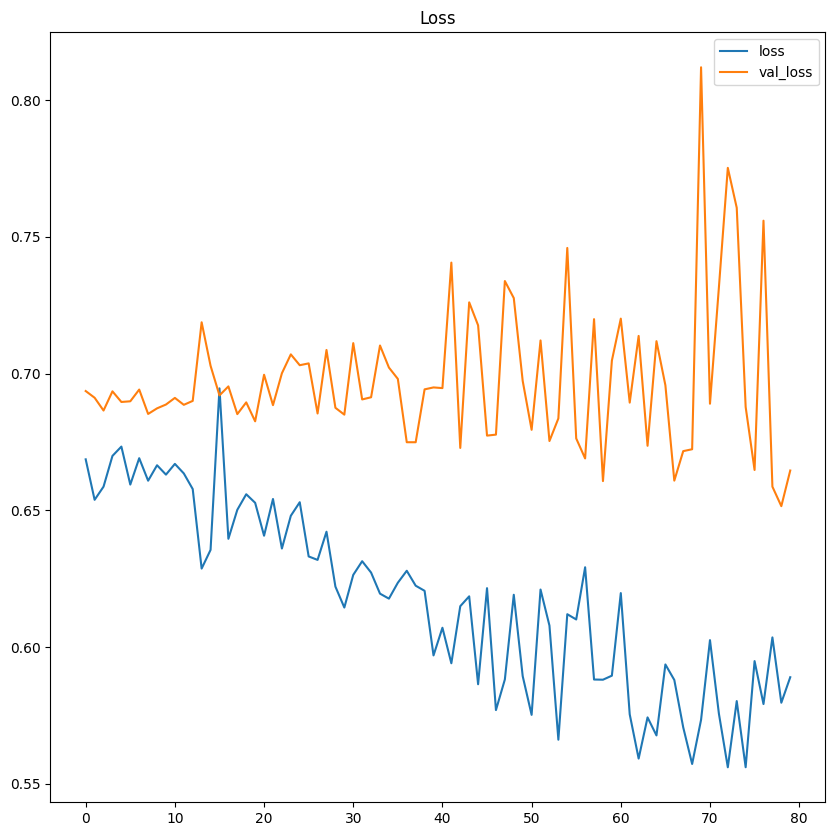

In [ ]:
import matplotlib.pyplot as plt
plt.title('Loss')
plt.plot(hist.history['loss'],label='loss')
plt.plot(hist.history['val_loss'],label='val_loss')
plt.legend()
plt.show()


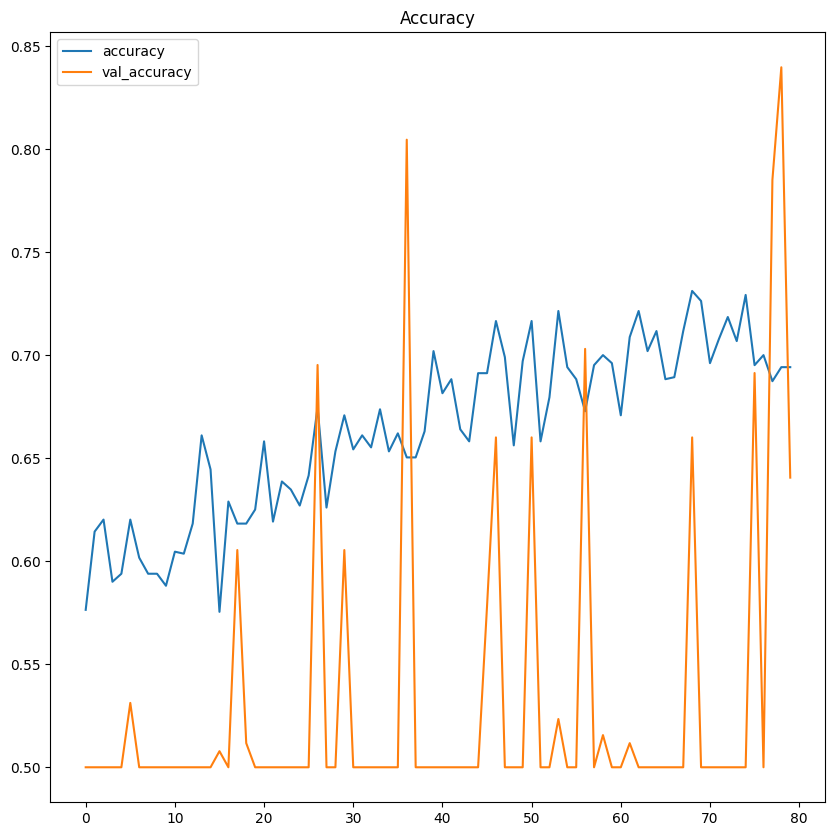

In [ ]:
plt.title('Accuracy')
plt.plot(hist.history['accuracy'],label='accuracy')
plt.plot(hist.history['val_accuracy'],label='val_accuracy')
plt.legend()
plt.show()


# 4.3 Imagenette

[Imagenette](https://github.com/fastai/imagenette) is a subset of Imagenet containing dataset of *easy* to classify images. We will use a variant named *imagenette/320px*, which contains images resized to 320 pixels (the shorter side).

**Remark: sizes of images in the dataset vary** To be delivered to a neural network, images must have fixed dimensions.



In [ ]:
import tensorflow_datasets as tfds
import tensorflow as tf


ds_train = tfds.load('imagenette/320px', split='train', as_supervised=True, shuffle_files=False)
ds_test = tfds.load('imagenette/320px', split='validation', as_supervised=True, shuffle_files=False)


In [ ]:
print(f'Number of images in train set: {ds_train.cardinality()}')
print(f'Number of images in test set: {ds_test.cardinality()}')

Number of images in train set: 12894
Number of images in test set: 500


In [ ]:
labels = [label.numpy() for _, label in ds_train]
print(max(labels)+1)
num_classes = max(labels)+1

10


In [ ]:
#image sizes?

ds_tmp = ds_train.take(10)
for img,label in ds_tmp:
  print(img.shape)

(320, 396, 3)
(320, 426, 3)
(320, 477, 3)
(320, 372, 3)
(320, 445, 3)
(320, 440, 3)
(320, 426, 3)
(479, 320, 3)
(480, 320, 3)
(381, 320, 3)


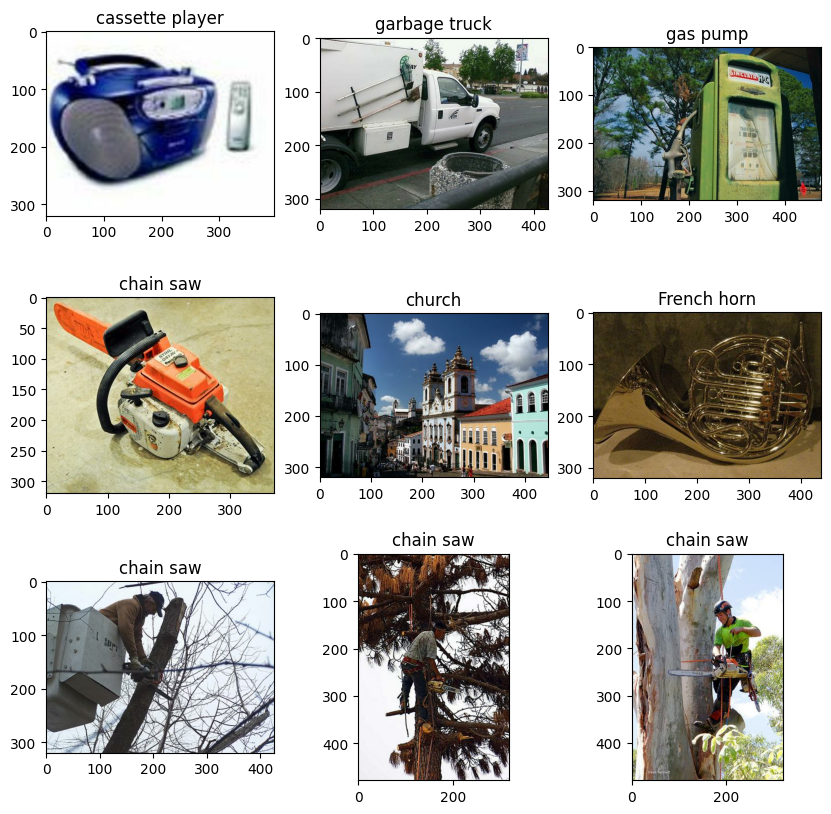

In [ ]:
#display a few images...
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10,10)
labels=['tench', 'English springer', 'cassette player', 'chain saw', 'church',
        'French horn', 'garbage truck', 'gas pump', 'golf ball', 'parachute']
ds2 = ds_train.take(9)
it = ds2.as_numpy_iterator()

input_size=100
for i in range(9):
  ax = plt.subplot(330 + 1 + i)
  image, label = next(it)
  # image = tf.image.resize(image, size=[256,256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  ax.set_title(labels[label])
  plt.imshow(image)
plt.show()

**TODO 4.3.1** Select a transformation that assures equal dimensions of all images (delivered to the neural network). Display images after the transformation.

In [ ]:
from keras import layers
from keras import models
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import tensorflow as tf


transform = models.Sequential([
  layers.Resizing(320,320),
  layers.Rescaling(1./255)
])


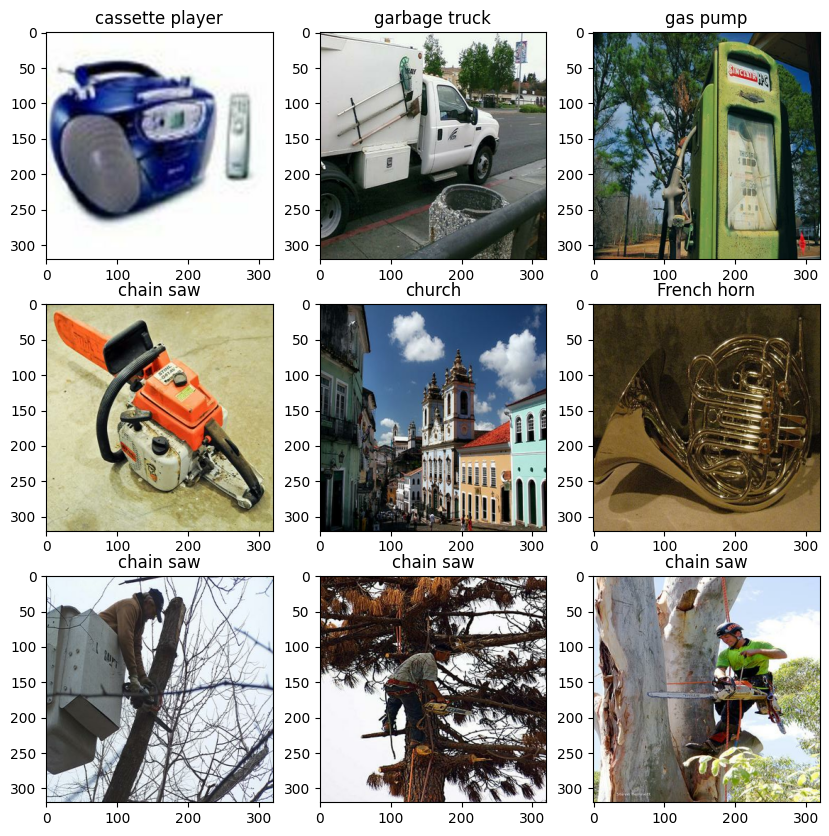

'\n#display a few images...\nimport matplotlib.pyplot as plt\nplt.rcParams["figure.figsize"] = (10,10)\n\nlabels=[\'tench\', \'English springer\', \'cassette player\', \'chain saw\', \'church\',\n        \'French horn\', \'garbage truck\', \'gas pump\', \'golf ball\', \'parachute\']\n\nds2 = ds_train.take(9)\nds2 = ds2.map(lambda x, y: (transform2(x), y))\nit = ds2.as_numpy_iterator()\n\ninput_size=100\nfor i in range(9):\n  ax = plt.subplot(330 + 1 + i)\n  image, label = next(it)\n  # image = tf.image.resize(image, size=[256,256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)\n  ax.set_title(labels[label])\n  plt.imshow(image)\nplt.show()'

In [ ]:

#display a few images...
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10,10)

labels=['tench', 'English springer', 'cassette player', 'chain saw', 'church',
        'French horn', 'garbage truck', 'gas pump', 'golf ball', 'parachute']

ds2 = ds_train.take(9)
ds2 = ds2.map(lambda x, y: (transform(x), y))
it = ds2.as_numpy_iterator()

input_size=100
for i in range(9):
  ax = plt.subplot(330 + 1 + i)
  image, label = next(it)
  # image = tf.image.resize(image, size=[256,256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  ax.set_title(labels[label])
  plt.imshow(image)
plt.show()

## 4.3.1 CNN classifier

**TODO 4.3.2** Define a CNN model comprising several convolution, max pooling and dropout layers. As there are 10 classes, the model should have 10 output neurons.

In [ ]:
from keras import layers
from keras import models
from keras import optimizers

image_width = 320
image_height = 320

classifier_model = models.Sequential([
    layers.Conv2D(16, (3,3), activation='relu', input_shape=(image_height,image_width, 3)),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.1),
    layers.Conv2D(32, (3,3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.15),
    layers.Conv2D(32, (3,3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.15),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.2),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.2),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.2),
    layers.Flatten(),
    #layers.Dense(128, activation='relu'),
    #layers.Dropout(0.3),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.25),
    layers.Dense(num_classes, activation='softmax')
])


**TODO 4.3.3** Prepare datasets. Assure identical dimensions of images.

In [ ]:

def prepare_dataset(ds,batch_size=64,resize=None, augment=None):
  if resize is not None:
    ds = ds.map(lambda x, y: (resize(x), y),
              num_parallel_calls=tf.data.AUTOTUNE)

  ds = ds.shuffle(1000)
  ds = ds.batch(batch_size)

  if augment is not None:
    ds = ds.map(lambda x, y: (augment(x), y),
              num_parallel_calls=tf.data.AUTOTUNE)

  return ds.prefetch(buffer_size=tf.data.AUTOTUNE)

ds_train_preprocessed = prepare_dataset(ds_train,batch_size=128,resize=transform)
ds_test_preprocessed = prepare_dataset(ds_test,batch_size=128,resize=transform)


**Compile** the model

In [ ]:
classifier_model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-4),
              metrics=['accuracy'])
classifier_model.summary()



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 318, 318, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 159, 159, 16)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 159, 159, 16)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 157, 157, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 78, 78, 32)        0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 78, 78, 32)       

...and train

In [ ]:
epochs = 20
hist = classifier_model.fit(ds_train_preprocessed,epochs=epochs,batch_size=128
                            ,validation_data=ds_test_preprocessed
                            )

Epoch 1/20
101/101 [==============================] - 67s 470ms/step - loss: 2.3016 - accuracy: 0.1124 - val_loss: 2.2976 - val_accuracy: 0.2300
Epoch 2/20
101/101 [==============================] - 43s 406ms/step - loss: 2.2361 - accuracy: 0.1822 - val_loss: 2.2152 - val_accuracy: 0.2360
Epoch 3/20
101/101 [==============================] - 42s 400ms/step - loss: 2.1321 - accuracy: 0.2311 - val_loss: 2.1317 - val_accuracy: 0.2640
Epoch 4/20
101/101 [==============================] - 44s 414ms/step - loss: 2.0897 - accuracy: 0.2447 - val_loss: 2.1017 - val_accuracy: 0.2780
Epoch 5/20
101/101 [==============================] - 43s 408ms/step - loss: 2.0583 - accuracy: 0.2595 - val_loss: 2.0889 - val_accuracy: 0.2760
Epoch 6/20
101/101 [==============================] - 44s 410ms/step - loss: 2.0224 - accuracy: 0.2765 - val_loss: 2.0713 - val_accuracy: 0.2960
Epoch 7/20
101/101 [==============================] - 45s 424ms/step - loss: 1.9868 - accuracy: 0.2943 - val_loss: 2.0171 - val_ac

**TODO 4.3.3** Compute accuracy

In [ ]:
loss, acc = classifier_model.evaluate(ds_test_preprocessed)
print("Accuracy", acc)

4/4 [==============================] - 1s 107ms/step - loss: 1.7418 - accuracy: 0.4340
Accuracy 0.4339999854564667


In [ ]:
classifier_model.save('imagenette_cnn.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## 4.3.2 Transfer learning
*  We will use pretrained vgg16 model for **feature extraction**.
*  Than we will flatten features to a vector form and add hidden dense layer
*  Finally, size of the output layer will correspond to the number of classes

In [ ]:
from keras.layers import Conv2D, Dense, Flatten, MaxPooling2D
from keras import Sequential

from keras.applications.vgg16 import VGG16
from keras.models import Model

def define_vgg16_model():
  # load model
  model = VGG16(include_top=False, input_shape=(320, 320, 3))
  # mark loaded layers as not trainable
  for layer in model.layers:
    layer.trainable = False
  # add new classifier layers
  full_model = models.Sequential([
      model,
      Flatten(),
      Dense(128, activation='relu', kernel_initializer='he_uniform'),
      Dense(num_classes, activation='softmax')
      ])

  full_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

  return full_model

model = define_vgg16_model()

58889256/58889256 [==============================] - 0s 0us/step


**TODO 4.3.4** Train the model and compute accuracy on the test data

In [ ]:
epochs = 2
hist = model.fit(ds_train_preprocessed,epochs = epochs,validation_data=ds_test_preprocessed)

Epoch 1/2
101/101 [==============================] - 225s 2s/step - loss: 1.1195 - accuracy: 0.7511 - val_loss: 0.3338 - val_accuracy: 0.9040
Epoch 2/2
101/101 [==============================] - 120s 1s/step - loss: 0.2138 - accuracy: 0.9411 - val_loss: 0.2663 - val_accuracy: 0.9180


In [ ]:
loss, acc = model.evaluate(ds_test_preprocessed)
print("Accuracy", acc)

4/4 [==============================] - 6s 1s/step - loss: 0.2663 - accuracy: 0.9180
Accuracy 0.9179999828338623


In [ ]:
model.save('imaginette_vgg16.h5')

### Compute scores and confusion matrix

We need true labels (y_test) and predictions (y_pred)

In [ ]:
import numpy as np

In [ ]:
y_test=[label.numpy() for img,label in ds_test]
y_test=np.array(y_test)
y_test.shape

(500,)

In [ ]:
import numpy as np
probs = model.predict(ds_test_preprocessed)
print(f'{probs.shape}')
y_pred = np.argmax(probs,axis=1)

4/4 [==============================] - 5s 1s/step
(500, 10)


In [ ]:
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt


# Define the confusion matrix for the results
def show_confusion_matrix(matrix, labels=None):
    num_classes = matrix.shape[0]
    if labels is None:
      labels = [str(i) for i in range(num_classes)]
    plt.figure(figsize=(num_classes, num_classes))
    hm = sns.heatmap(matrix,
                cmap='coolwarm',
                linecolor='white',
                linewidths=1,
                xticklabels=labels[0:num_classes],
                yticklabels=labels[0:num_classes],
                annot=True,
                fmt='d')
    plt.yticks(rotation = 0)  # Don't rotate (vertically) the y-axis labels
    # hm.set_ylim(0, len(matrix))
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

def compute_and_show_confusion_matrix(validations, predictions, labels=None):
    matrix = metrics.confusion_matrix(validations, predictions)
    show_confusion_matrix(matrix, labels)

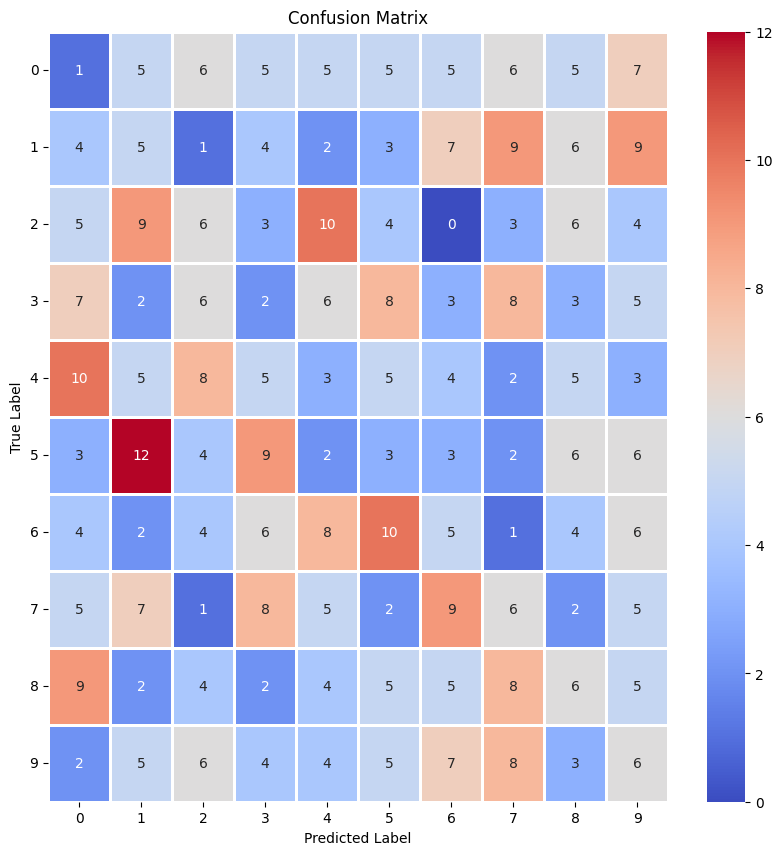

              precision    recall  f1-score   support

           0       0.02      0.02      0.02        50
           1       0.09      0.10      0.10        50
           2       0.13      0.12      0.12        50
           3       0.04      0.04      0.04        50
           4       0.06      0.06      0.06        50
           5       0.06      0.06      0.06        50
           6       0.10      0.10      0.10        50
           7       0.11      0.12      0.12        50
           8       0.13      0.12      0.12        50
           9       0.11      0.12      0.11        50

    accuracy                           0.09       500
   macro avg       0.09      0.09      0.09       500
weighted avg       0.09      0.09      0.09       500



In [ ]:
compute_and_show_confusion_matrix(y_test,y_pred)
print(classification_report(y_test, y_pred))

### Soemthing went wrong?

Possible cause - ds_test_preprocessed stream contains **shuffle()** stage.

**TODO 4.3.5** prepare a Dataset ```ds_test_validation```, which does not involve reoredring images (but transforms them to correct size and correctly prepare batches). Then repeat evaluation steps.

In [ ]:
rotate = layers.Resizing(320, 320)
rescale = layers.Rescaling(1./255)

ds_test_validation = ds_test.map(lambda x, y: (rescale(rotate(x)), y)).batch(128)

In [ ]:
#compute y_pred using ds_test_validation

probs = model.predict(ds_test_validation)
print(f'{probs.shape}')
y_pred = np.argmax(probs,axis=1)

4/4 [==============================] - 4s 1s/step
(500, 10)


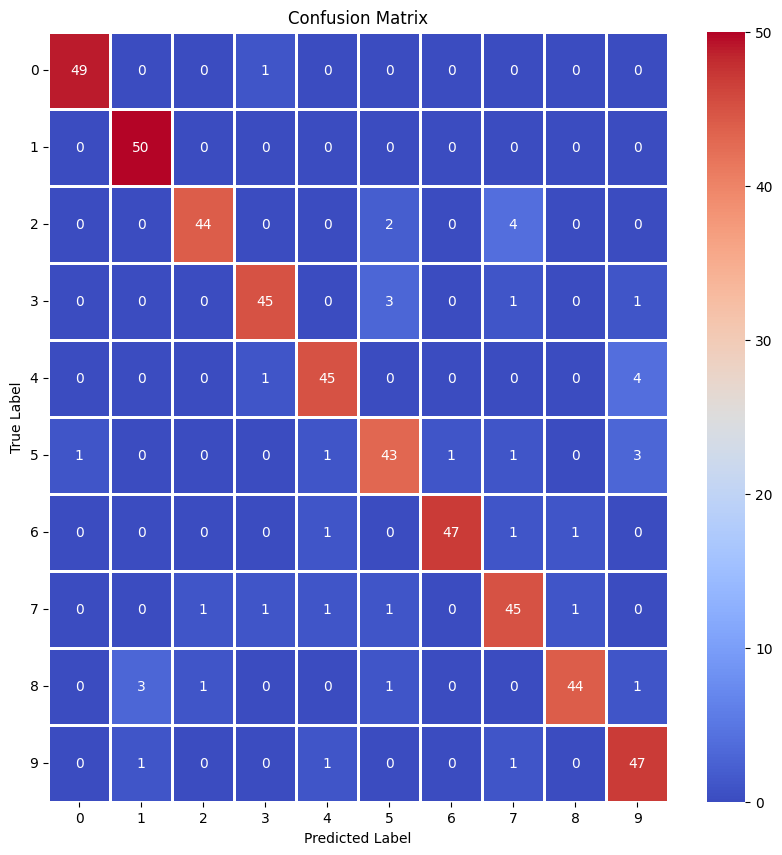

              precision    recall  f1-score   support

           0       0.98      0.98      0.98        50
           1       0.93      1.00      0.96        50
           2       0.96      0.88      0.92        50
           3       0.94      0.90      0.92        50
           4       0.92      0.90      0.91        50
           5       0.86      0.86      0.86        50
           6       0.98      0.94      0.96        50
           7       0.85      0.90      0.87        50
           8       0.96      0.88      0.92        50
           9       0.84      0.94      0.89        50

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



In [ ]:
compute_and_show_confusion_matrix(y_test,y_pred)
print(classification_report(y_test, y_pred))